In [14]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import matplotlib.pyplot as plt
plt.style.use('ggplot')
import pandas as pd
import numpy as np
import seaborn as sns
import warnings
import os
import pickle

warnings.filterwarnings('ignore')
pd.options.display.float_format = '{:,.2f}'.format
pd.set_option('display.max_rows', 100)
pd.set_option('display.max_columns', 200)

!pip install keras
!pip install keras-vis
!pip install --upgrade keras-vis
!pip install Pillow
!git clone https://github.com/JefHuiza/Proyectos_de_Ingenieria.git

# Restore the original print function
from builtins import print as print_function

from tensorflow.keras.models import Model, Sequential, load_model
from tensorflow.keras.layers import Dense, Input, Conv2D, MaxPooling2D, Flatten, Dropout # Import convolutional layers directly from tensorflow.keras.layers
from tensorflow.keras.datasets import mnist
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing import image
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import activations
from tensorflow.keras.applications import VGG16
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras import backend as K
from collections.abc import Iterable # Import Iterable from collections.abc

Cloning into 'Proyectos_de_Ingenieria'...
remote: Enumerating objects: 3932, done.
remote: Counting objects: 100% (917/917), done.
remote: Compressing objects: 100% (662/662), done.
remote: Total 3932 (delta 272), reused 832 (delta 235), pack-reused 3015 (from 1)
Receiving objects: 100% (3932/3932), 148.21 MiB | 36.12 MiB/s, done.
Resolving deltas: 100% (273/273), done.
Updating files: 100% (3134/3134), done.


In [ ]:
from tensorflow.keras.models import Model
import matplotlib.pyplot as plt
import numpy as np

def visualize_activation(model, layer_name, input_image):
    layer = model.get_layer(name=layer_name)
    activation_model = Model(inputs=model.input, outputs=layer.output)
    activations = activation_model.predict(input_image)
    n_filters = activations.shape[-1]
    n_cols = 8
    n_rows = int(np.ceil(n_filters / n_cols))
    plt.figure(figsize=(n_cols * 2, n_rows * 2))
    for i in range(n_filters):
        ax = plt.subplot(n_rows, n_cols, i + 1)
        ax.imshow(activations[0, :, :, i], cmap='viridis')
        ax.axis('off')
    plt.show()

# Utility Functions

In [ ]:
def smooth_curve(points, factor=0.8):
    smoothed = []
    for point in points:
        if smoothed:
            previous = smoothed[-1]
            smoothed.append(previous * factor + point * (1 - factor))
        else:
            smoothed.append(point)
    return smoothed

def plot_compare(history, steps=-1):
    if steps < 0:
        steps = len(history.history['accuracy'])
    acc = smooth_curve(history.history['accuracy'][:steps])
    val_acc = smooth_curve(history.history['val_accuracy'][:steps])
    loss = smooth_curve(history.history['loss'][:steps])
    val_loss = smooth_curve(history.history['val_loss'][:steps])

    plt.figure(figsize=(6, 4))
    plt.plot(loss, c='#0c7cba', label='Train Loss')
    plt.plot(val_loss, c='#0f9d58', label='Val Loss')
    plt.xticks(range(0, len(loss), 5))
    plt.xlim(0, len(loss))
    plt.title('Train Loss: %.3f, Val Loss: %.3f' % (loss[-1], val_loss[-1]), fontsize=12)
    plt.legend()

    plt.figure(figsize=(6, 4))
    plt.plot(acc, c='#0c7cba', label='Train Acc')
    plt.plot(val_acc, c='#0f9d58', label='Val Acc')
    plt.xticks(range(0, len(acc), 5))
    plt.xlim(0, len(acc))
    plt.title('Train Accuracy: %.3f, Val Accuracy: %.3f' % (acc[-1], val_acc[-1]), fontsize=12)
    plt.legend()

def deprocess_image(x):
    # normalize tensor: center on 0., ensure std is 0.1
    x -= x.mean()
    x /= (x.std() + 1e-5)
    x *= 0.1

    # clip to [0, 1]
    x += 0.5
    x = np.clip(x, 0, 1)

    # convert to RGB array
    x *= 255
    x = np.clip(x, 0, 255).astype('uint8')
    return x

def save_history(history, fn):
    with open(fn, 'wb') as fw:
        pickle.dump(history.history, fw, protocol=2)

def load_history(fn):
    class Temp():
        pass
    history = Temp()
    with open(fn, 'rb') as fr:
        history.history = pickle.load(fr)
    return history

def jitter(img, amount=32):
    ox, oy = np.random.randint(-amount, amount+1, 2)
    return np.roll(np.roll(img, ox, -1), oy, -2), ox, oy

def reverse_jitter(img, ox, oy):
    return np.roll(np.roll(img, -ox, -1), -oy, -2)

def plot_image(img):
    plt.figure(figsize=(6, 6))
    plt.imshow(img)
    plt.axis('off')

# Building a Convolutional Neural Network

### Model Definition

In [17]:
model = Sequential()
model.add(Conv2D(32, (3, 3), activation='relu', padding='same', name='conv_1',
                 input_shape=(150, 150, 3)))
model.add(MaxPooling2D((2, 2), name='maxpool_1'))
model.add(Conv2D(64, (3, 3), activation='relu', padding='same', name='conv_2'))
model.add(MaxPooling2D((2, 2), name='maxpool_2'))
model.add(Conv2D(128, (3, 3), activation='relu', padding='same', name='conv_3'))
model.add(MaxPooling2D((2, 2), name='maxpool_3'))
model.add(Conv2D(128, (3, 3), activation='relu', padding='same', name='conv_4'))
model.add(MaxPooling2D((2, 2), name='maxpool_4'))
model.add(Flatten())
model.add(Dropout(0.5))
model.add(Dense(512, activation='relu', name='dense_1'))
model.add(Dense(256, activation='relu', name='dense_2'))
model.add(Dense(1, activation='sigmoid', name='output'))

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

### Data Generator

In [16]:
base_dir = '/content/Proyectos_de_Ingenieria/Entregables/Entregable_2/Perros_Gatos'
train_dir = os.path.join(base_dir, 'train')
validation_dir = os.path.join(base_dir, 'validation')
test_dir = os.path.join(base_dir, 'test')

train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='binary')

validation_generator = test_datagen.flow_from_directory(
        validation_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='binary')

# Check if the generators are yielding data
print("Number of training batches:", len(train_generator))
print("Number of validation batches:", len(validation_generator))

# Try to load a batch from each generator
try:
    train_batch = next(train_generator)
    print("Successfully loaded a training batch.")
except StopIteration:
    print("Training generator is empty.")

try:
    validation_batch = next(validation_generator)
    print("Successfully loaded a validation batch.")
except StopIteration:
    print("Validation generator is empty.")

Found 1001 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.
Number of training batches: 51
Number of validation batches: 50
Successfully loaded a training batch.
Successfully loaded a validation batch.


In [ ]:
val_batch = next(validation_generator)
print(val_batch[0].shape, val_batch[1].shape)  # Debe imprimir las formas de las imágenes y las etiquetas

(20, 150, 150, 3) (20,)


### TRAINING

In [ ]:
history = model.fit(train_generator, steps_per_epoch=100, epochs=20,
                              validation_data=validation_generator, validation_steps=15, verbose=1)

Epoch 1/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 70s 667ms/step - accuracy: 0.4866 - loss: 0.7160 - val_accuracy: 0.5233 - val_loss: 0.6928
Epoch 2/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 66s 649ms/step - accuracy: 0.4946 - loss: 0.6949 - val_accuracy: 0.5133 - val_loss: 0.6927
Epoch 3/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 72s 702ms/step - accuracy: 0.5352 - loss: 0.6887 - val_accuracy: 0.5167 - val_loss: 0.6915
Epoch 4/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 64s 640ms/step - accuracy: 0.5411 - loss: 0.6893 - val_accuracy: 0.5200 - val_loss: 0.6923
Epoch 5/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 85s 662ms/step - accuracy: 0.5133 - loss: 0.6907 - val_accuracy: 0.4733 - val_loss: 0.6936
Epoch 6/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 65s 641ms/step - accuracy: 0.5674 - loss: 0.6785 - val_accuracy: 0.4867 - val_loss: 0.6904
Epoch 7/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 66s 653ms/step - accuracy: 0.5154 - loss: 0.6896 - val_accuracy: 0.5033 - val_loss: 0.6888
Epoch 8/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 61s 608ms/step - accuracy: 0.5302 - loss: 0

In [ ]:
model.save('model.h5')
save_history(history, 'history.bin')

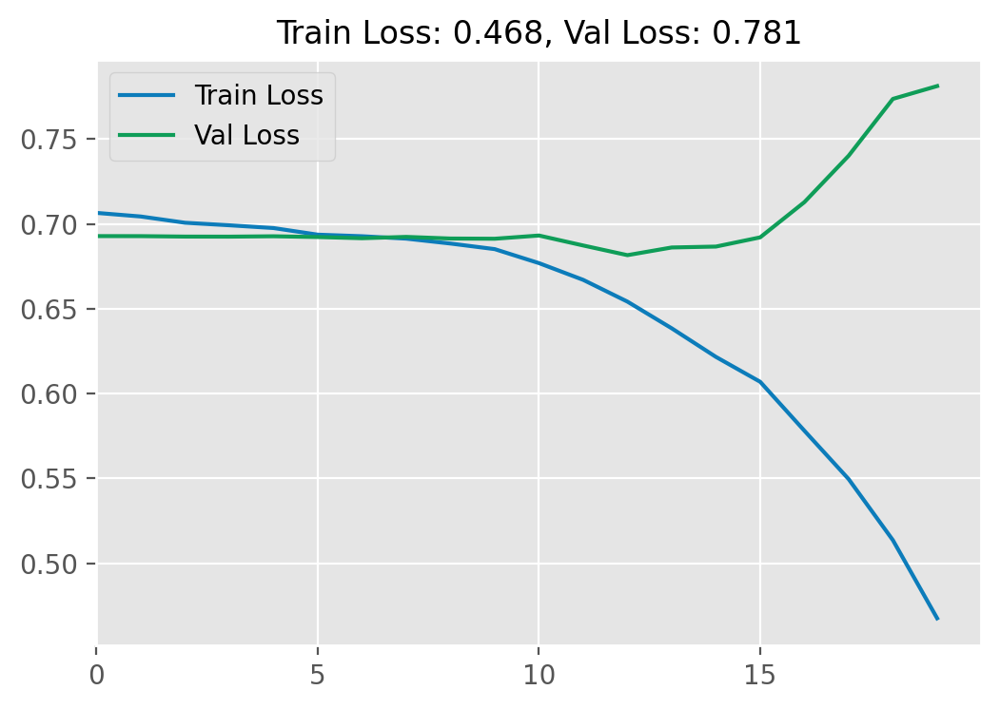

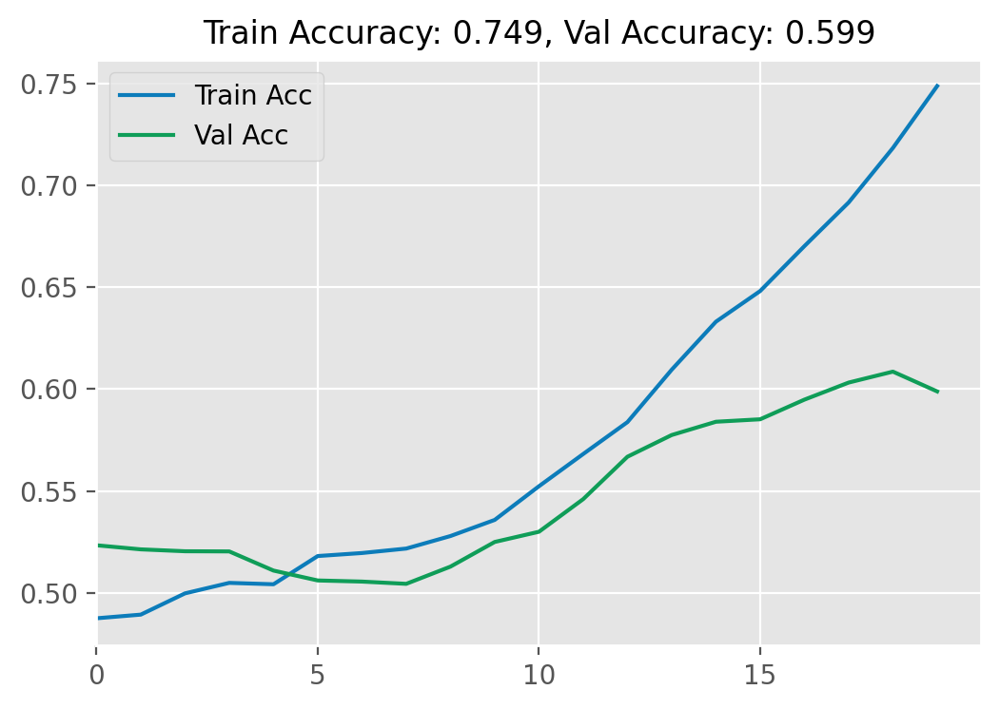

In [ ]:
history = load_history('history.bin')
plot_compare(history)

# Data Augmentation

In [ ]:
model_aug = Sequential()
model_aug.add(Conv2D(32, (3, 3), activation='relu', padding='same', name='conv_1',
                 input_shape=(150, 150, 3)))
model_aug.add(MaxPooling2D((2, 2), name='maxpool_1'))
model_aug.add(Conv2D(64, (3, 3), activation='relu', padding='same', name='conv_2'))
model_aug.add(MaxPooling2D((2, 2), name='maxpool_2'))
model_aug.add(Conv2D(128, (3, 3), activation='relu', padding='same', name='conv_3'))
model_aug.add(MaxPooling2D((2, 2), name='maxpool_3'))
model_aug.add(Conv2D(128, (3, 3), activation='relu', padding='same', name='conv_4'))
model_aug.add(MaxPooling2D((2, 2), name='maxpool_4'))
model_aug.add(Flatten())
model_aug.add(Dropout(0.5))
model_aug.add(Dense(512, activation='relu', name='dense_1'))
model_aug.add(Dense(256, activation='relu', name='dense_2'))
model_aug.add(Dense(1, activation='sigmoid', name='output'))

In [ ]:
model_aug.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [ ]:
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,)

# Note that the validation data should not be augmented!
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=(150, 150),
        batch_size=16,
        class_mode='binary')

validation_generator = test_datagen.flow_from_directory(
        validation_dir,
        target_size=(150, 150),
        batch_size=16,
        class_mode='binary')

# early_stop = EarlyStopping(monitor='val_loss', patience=6, verbose=1)
history_aug = model_aug.fit(train_generator, steps_per_epoch=80, epochs=30,
                                      validation_data=validation_generator, validation_steps=15, verbose=1)

Found 1001 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.
Epoch 1/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 73s 859ms/step - accuracy: 0.5047 - loss: 0.7004 - val_accuracy: 0.4375 - val_loss: 0.6945
Epoch 2/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 81s 837ms/step - accuracy: 0.5314 - loss: 0.6921 - val_accuracy: 0.4708 - val_loss: 0.6961
Epoch 3/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 69s 843ms/step - accuracy: 0.4993 - loss: 0.6941 - val_accuracy: 0.5083 - val_loss: 0.6929
Epoch 4/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 70s 866ms/step - accuracy: 0.5385 - loss: 0.6930 - val_accuracy: 0.4833 - val_loss: 0.6917
Epoch 5/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 97s 1s/step - accuracy: 0.5596 - loss: 0.6793 - val_accuracy: 0.6000 - val_loss: 0.6349
Epoch 6/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 70s 857ms/step - accuracy: 0.5517 - loss: 0.6770 - val_accuracy: 0.5250 - val_loss: 0.6904
Epoch 7/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 82s 853ms/step - accuracy: 0.5319 - loss: 0.6852 - val_accuracy: 0.5250 - val_loss: 0.6878
Epoch 8/30
80/80

In [ ]:
model_aug.save('model_aug.h5')
save_history(history_aug, 'history_aug.bin')

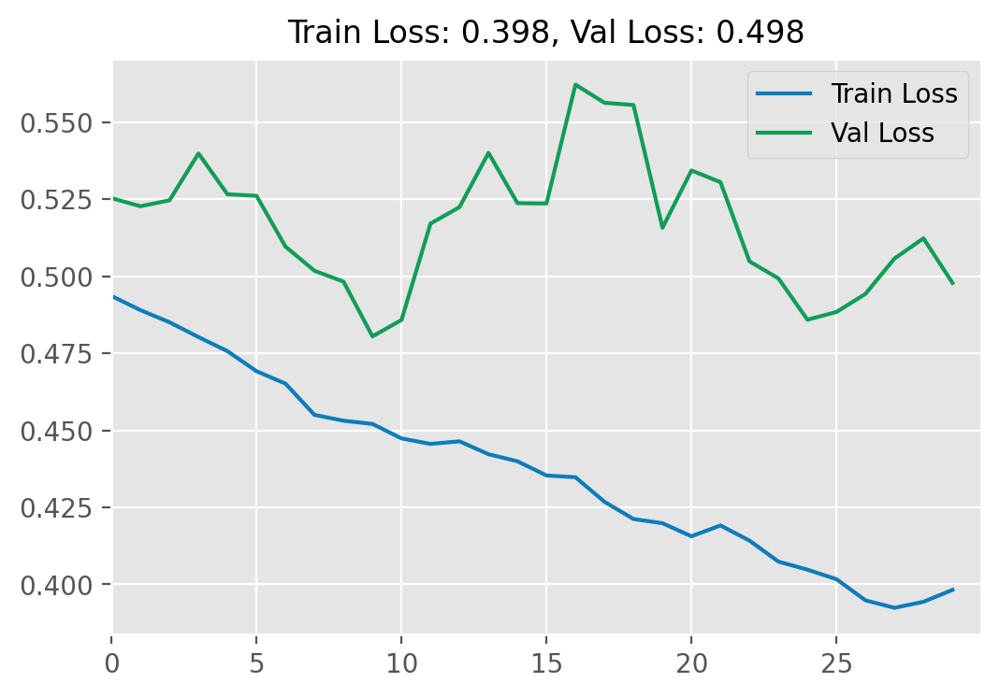

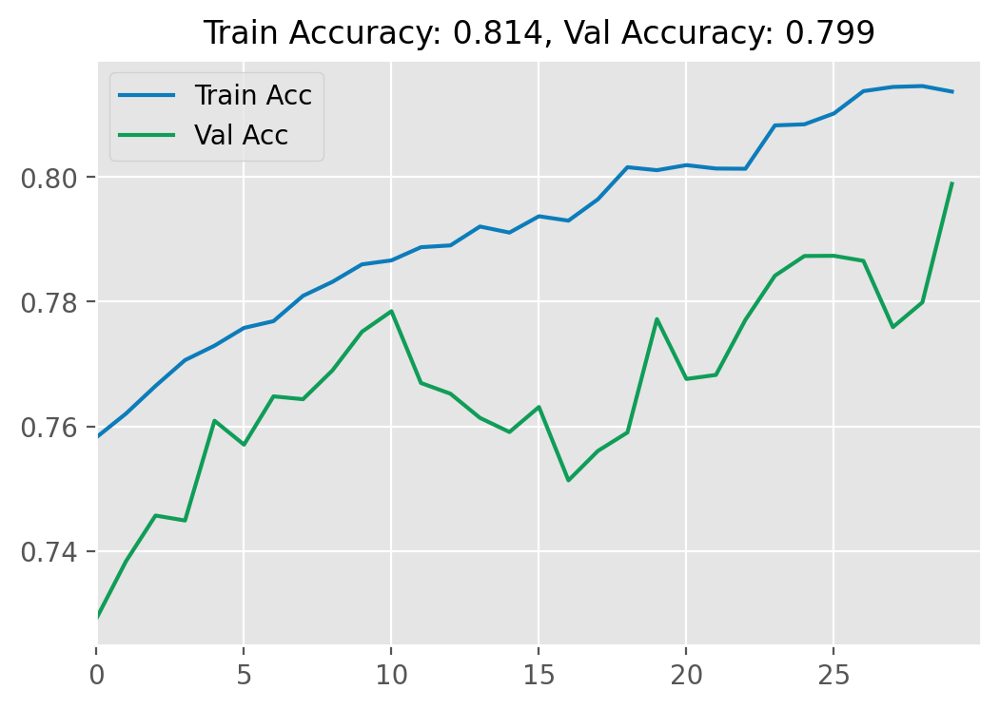

In [ ]:
history_aug = load_history('history_aug.bin')
plot_compare(history_aug, steps=50)

# Visualizing Feature Maps

In [15]:
img_path = '/content/Proyectos_de_Ingenieria/Entregables/Entregable_2/Perros_Gatos/test/Gatos/cat.1.jpg'

img = image.load_img(img_path, target_size=(150, 150))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
img_tensor /= 255.
print(img_tensor.shape)

(1, 150, 150, 3)


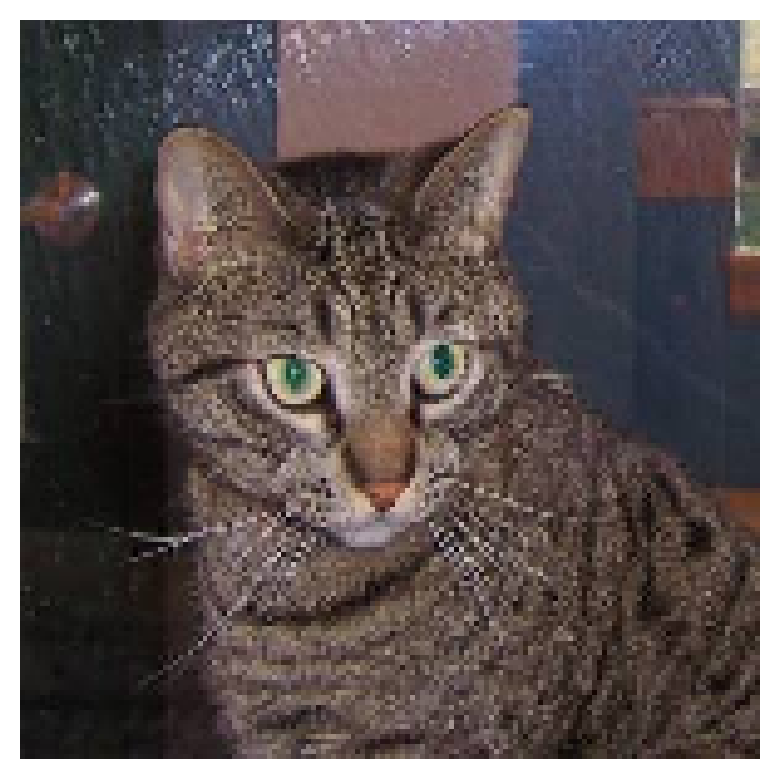

In [ ]:
plt.imshow(img_tensor[0])
plt.axis('off')
plt.show()

In [ ]:
vgg = VGG16(weights='imagenet', include_top=False)
vgg.summary()

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "vgg16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)           │ (None, None, None, 3)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, None, None, 64)      │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, None, None, 64)      │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, None, None, 64)      │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, None, None, 128)     │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, None, None, 128)     │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, None, None, 128)     │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, None, None, 256)     │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, None, None, 256)     │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, None, None, 256)     │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, None, None, 256)     │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, None, None, 512)     │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, None, None, 512)     │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, None, None, 512)     │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, None, None, 512)     │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, None, None, 512)     │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, None, None, 512)     │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, None, None, 512)     │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, None, None, 512)     │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,714,688 (56.13 MB)

 Trainable params: 14,714,688 (56.13 MB)

 Non-trainable params: 0 (0.00 B)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


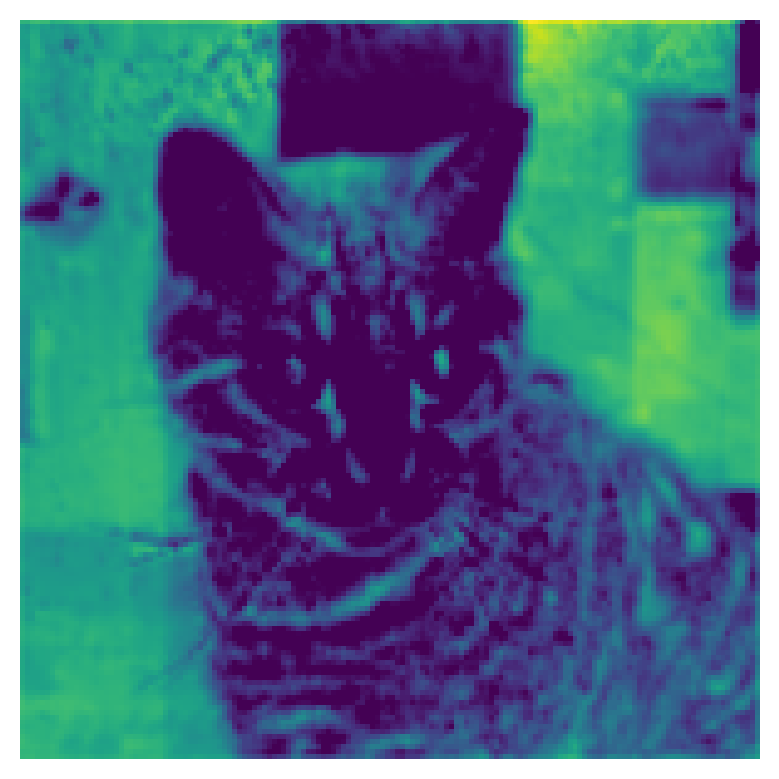

In [ ]:
# Extracts the outputs of the top 8 layers:
layer_outputs = [layer.output for layer in vgg.layers if 'conv1' in layer.name]
activation_model = Model(inputs=vgg.input, outputs=layer_outputs)
intermediate_activations = activation_model.predict(img_tensor)

first_layer_activation = intermediate_activations[0]

plt.imshow(first_layer_activation[0, :, :, 19], cmap='viridis')
plt.axis('off')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


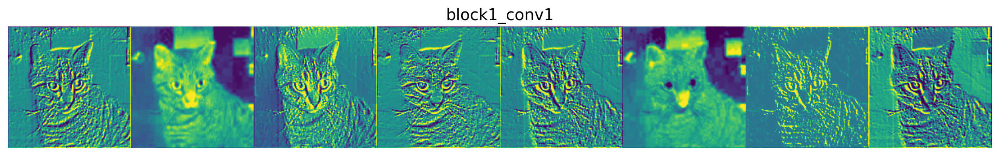

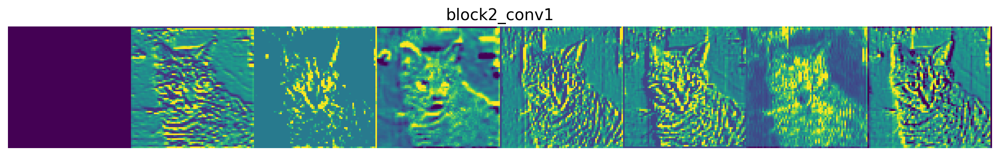

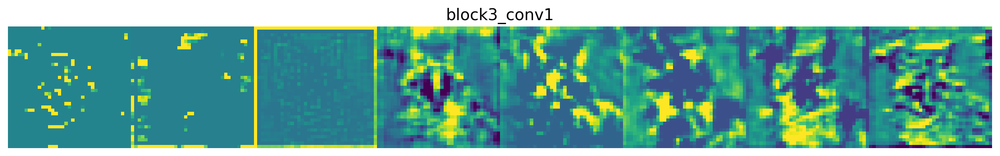

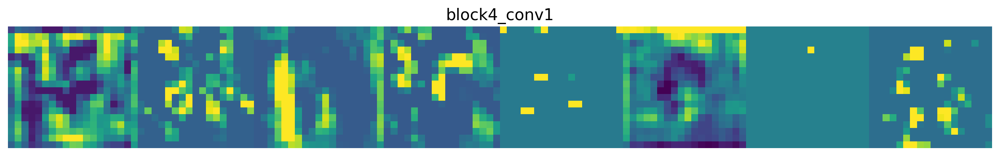

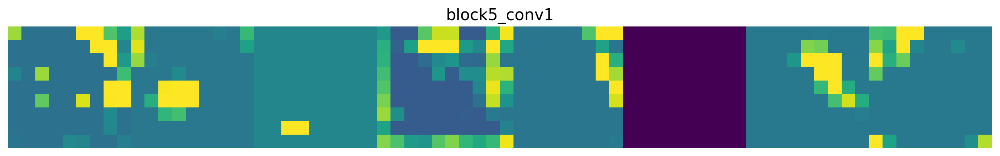

In [ ]:
layer_names = ['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1', 'block5_conv1']

layer_outputs = [layer.output for layer in vgg.layers if layer.name in layer_names]
activation_model = Model(inputs=vgg.input, outputs=layer_outputs)
intermediate_activations = activation_model.predict(img_tensor)

images_per_row = 8
max_images = 8
# Now let's display our feature maps
for layer_name, layer_activation in zip(layer_names, intermediate_activations):
    # This is the number of features in the feature map
    n_features = layer_activation.shape[-1]
    n_features = min(n_features, max_images)

    # The feature map has shape (1, size, size, n_features)
    size = layer_activation.shape[1]

    # We will tile the activation channels in this matrix
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # We'll tile each filter into this big horizontal grid
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            # Post-process the feature to make it visually palatable
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    # Display the grid
    scale = 2. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.axis('off')
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')

plt.show()

# Dense Layer Visualization

In [4]:
!pip install git+https://github.com/raghakot/keras-vis.git -q

  Preparing metadata (setup.py) ... done


In [5]:
from vis.utils import utils
from keras import activations
from keras.applications import VGG16

In [6]:
import tensorflow as tf
print(tf.__version__)


2.17.0


In [ ]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras import activations
from tensorflow.keras.models import Model

# Build the VGG16 network with ImageNet weights
model = VGG16(weights='imagenet', include_top=True)

# Find the layer index by name
layer_name = 'predictions'
layer_idx = next(i for i, layer in enumerate(model.layers) if layer.name == layer_name)

# Swap softmax with linear
model.layers[layer_idx].activation = activations.linear
model = Model(inputs=model.input, outputs=model.output)

# You might need to recompile or apply other modifications

553467096/553467096 ━━━━━━━━━━━━━━━━━━━━ 7s 0us/step


In [7]:
!pip install tf-explain

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 765.6 kB/s eta 0:00:00


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


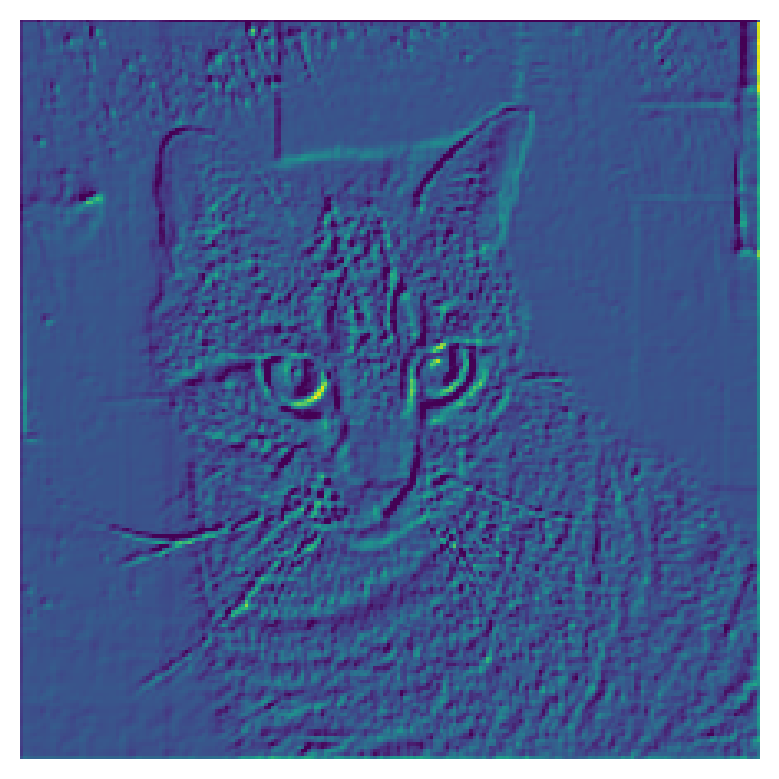

In [18]:
from tensorflow.keras.models import Model
from tensorflow.keras.applications import VGG16
from tensorflow.keras.preprocessing.image import img_to_array, load_img
import numpy as np
import matplotlib.pyplot as plt

# Cargar el modelo VGG16 con los pesos de ImageNet
model = VGG16(weights='imagenet', include_top=False)  # exclude the top classification layer

# Seleccionar la capa de interés
layer_name = 'block1_conv1'
intermediate_layer_model = Model(inputs=model.input,
                                 outputs=model.get_layer(layer_name).output)

# Cargar una imagen y preprocesarla
img_path = '/content/Proyectos_de_Ingenieria/Entregables/Entregable_2/Perros_Gatos/test/Gatos/cat.1.jpg'
img = load_img(img_path, target_size=(224, 224))
img = img_to_array(img)
img = np.expand_dims(img, axis=0)
img = img / 255.0  # Normalizar la imagen

# Obtener la salida de la capa intermedia
intermediate_output = intermediate_layer_model.predict(img)

# Mostrar la activación de la primera característica
plt.imshow(intermediate_output[0, :, :, 0], cmap='viridis')
plt.axis('off')
plt.show()



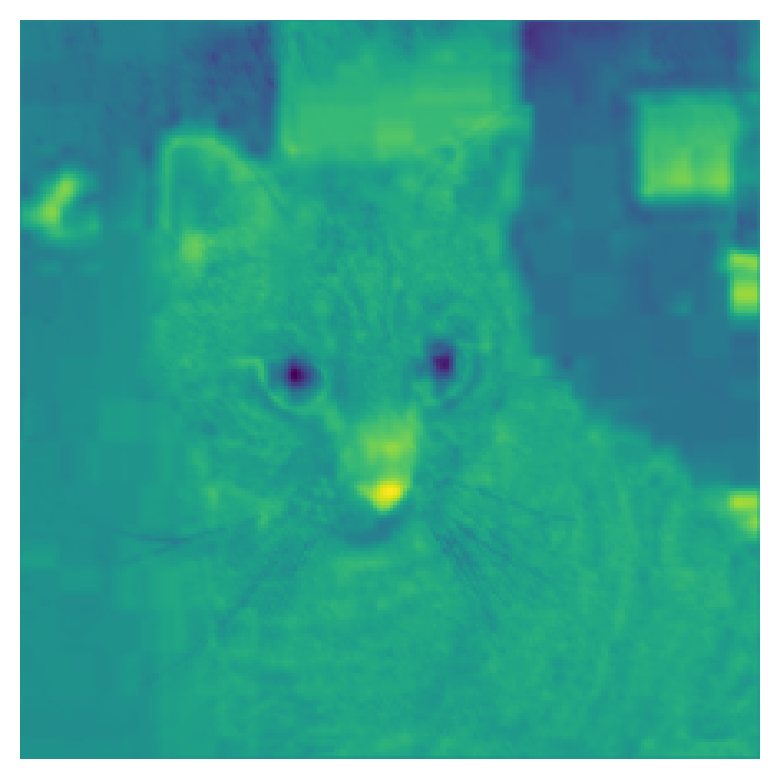

In [19]:
plt.imshow(intermediate_output[0, :, :, 5], cmap='viridis')  # Cambia el número para ver otros filtros
plt.axis('off')
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


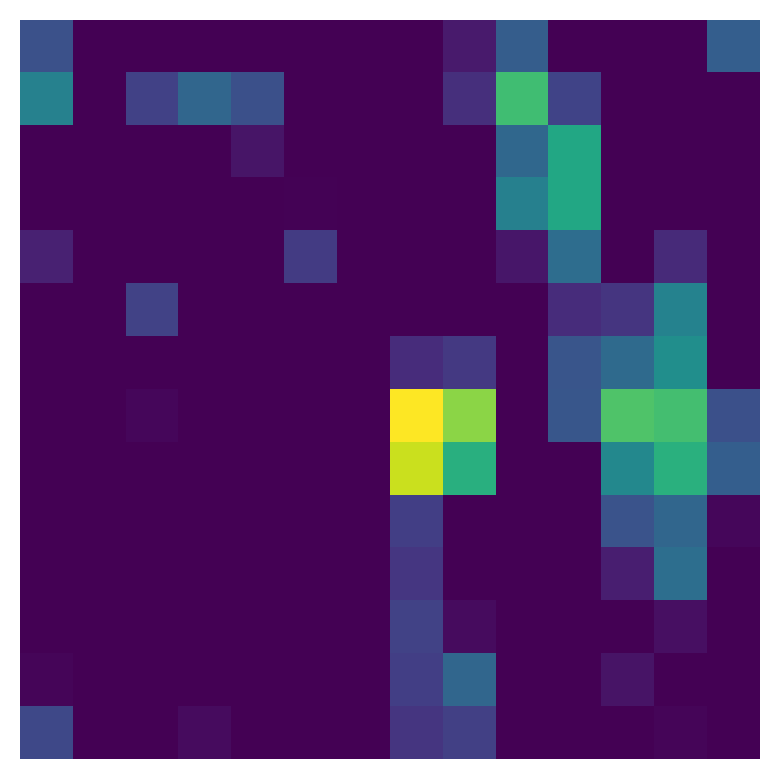

In [20]:
layer_name = 'block5_conv1'
intermediate_layer_model = Model(inputs=model.input,
                                 outputs=model.get_layer(layer_name).output)
intermediate_output = intermediate_layer_model.predict(img)

plt.imshow(intermediate_output[0, :, :, 0], cmap='viridis')
plt.axis('off')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 656ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 666ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 662ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 681ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 791ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 646ms/step


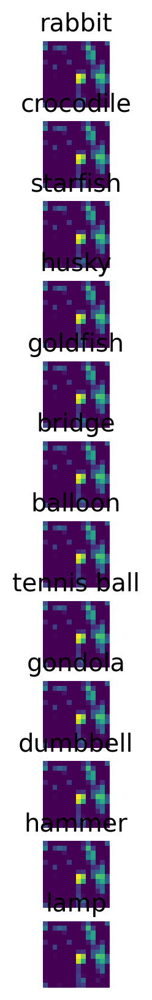

In [22]:
from tensorflow.keras.models import Model
from tensorflow.keras.applications import VGG16
from tensorflow.keras.preprocessing.image import img_to_array, load_img
import numpy as np
import matplotlib.pyplot as plt

codes = '''
rabbit 330
crocodile 49
starfish 327
husky 248
goldfish 1
bridge 889
balloon 417
tennis ball 852
gondola 576
dumbbell 543
hammer 587
lamp 846
'''

# Configuración del modelo
model = VGG16(weights='imagenet', include_top=False)

# Crear una lista para almacenar imágenes y nombres
images = []
tuples = []

# Iterar sobre las clases en 'codes'
for line in codes.split('\n'):
    if not line:
        continue

    name, idx = line.rsplit(' ', 1)
    idx = int(idx)

    # Seleccionar la capa y crear el modelo intermedio
    layer_name = 'block5_conv1'  # Cambiar según sea necesario
    intermediate_layer_model = Model(inputs=model.input,
                                     outputs=model.get_layer(layer_name).output)

    # Cargar la imagen de ejemplo para cada ítem
    img_path = '/content/Proyectos_de_Ingenieria/Entregables/Entregable_2/Perros_Gatos/test/Gatos/cat.1.jpg'
    img = load_img(img_path, target_size=(224, 224))
    img = img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = img / 255.0  # Normalizar la imagen

    # Obtener la salida de la capa intermedia
    intermediate_output = intermediate_layer_model.predict(img)

    # Guardar la imagen y el nombre en las listas
    images.append(intermediate_output[0, :, :, 0])  # Cambia el índice para ver otros filtros
    tuples.append((name, idx))

# Mostrar las imágenes
fig, axes = plt.subplots(len(images), 1, figsize=(10, 10))
for i, ax in enumerate(axes):
    ax.imshow(images[i], cmap='viridis')
    ax.set_title(tuples[i][0])
    ax.axis('off')
plt.show()

# Visualizing Convnet Filters

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1

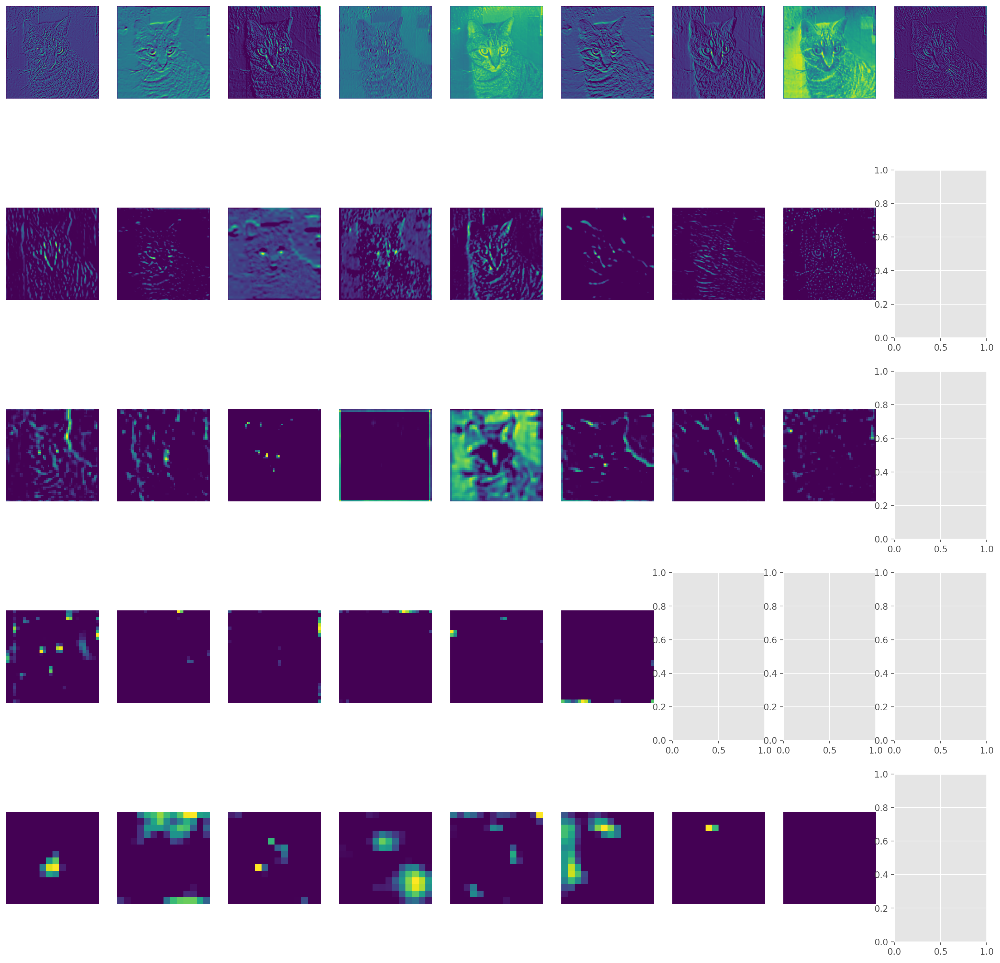

In [23]:
from tensorflow.keras.models import Model
from tensorflow.keras.applications import VGG16
from tensorflow.keras.preprocessing.image import img_to_array, load_img
import numpy as np
import matplotlib.pyplot as plt

# Parámetros de la visualización
max_filters = 40
selected_indices = [[], [], [], [], []]
vis_images = [[], [], [], [], []]
i = 0

# Capas de interés
layer_names = ['block1_conv2', 'block2_conv2', 'block3_conv3', 'block4_conv3', 'block5_conv3']

# Seleccionar filtros específicos para cada capa
selected_filters = [[0, 9, 13, 11, 25, 26, 33, 42, 62],
                    [8, 21, 23, 30, 39, 45, 59, 79],
                    [14, 48, 52, 54, 87, 107, 224, 229],
                    [25, 48, 63, 97, 147, 259],
                    [29, 77, 84, 104, 138, 206, 461, 487]]

for layer_name in layer_names:
    # Crear modelo intermedio para cada capa
    intermediate_layer_model = Model(inputs=model.input,
                                     outputs=model.get_layer(layer_name).output)

    # Si hay filtros seleccionados, usarlos
    if selected_filters:
        filters = selected_filters[i]
    else:
        filters = sorted(np.random.permutation(get_num_filters(model.get_layer(layer_name))))[:max_filters]

    selected_indices[i] = filters

    # Generar imágenes de entrada para cada filtro
    for filter_idx in filters:
        # Cargar la imagen de ejemplo
        img_path = '/content/Proyectos_de_Ingenieria/Entregables/Entregable_2/Perros_Gatos/test/Gatos/cat.1.jpg'
        img = load_img(img_path, target_size=(224, 224))
        img = img_to_array(img)
        img = np.expand_dims(img, axis=0)
        img = img / 255.0  # Normalizar la imagen

        # Obtener la salida de la capa intermedia para este filtro
        intermediate_output = intermediate_layer_model.predict(img)

        vis_images[i].append(intermediate_output[0, :, :, filter_idx])  # Visualizar cada filtro específico

    i += 1

# Generar una paleta de imágenes con 4 columnas para obtener 2 filas
fig, axes = plt.subplots(len(vis_images), len(vis_images[0]), figsize=(20, 20))
for j in range(len(vis_images)):
    for k in range(len(vis_images[j])):
        axes[j, k].imshow(vis_images[j][k], cmap='viridis')
        axes[j, k].axis('off')
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 527ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 785ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 

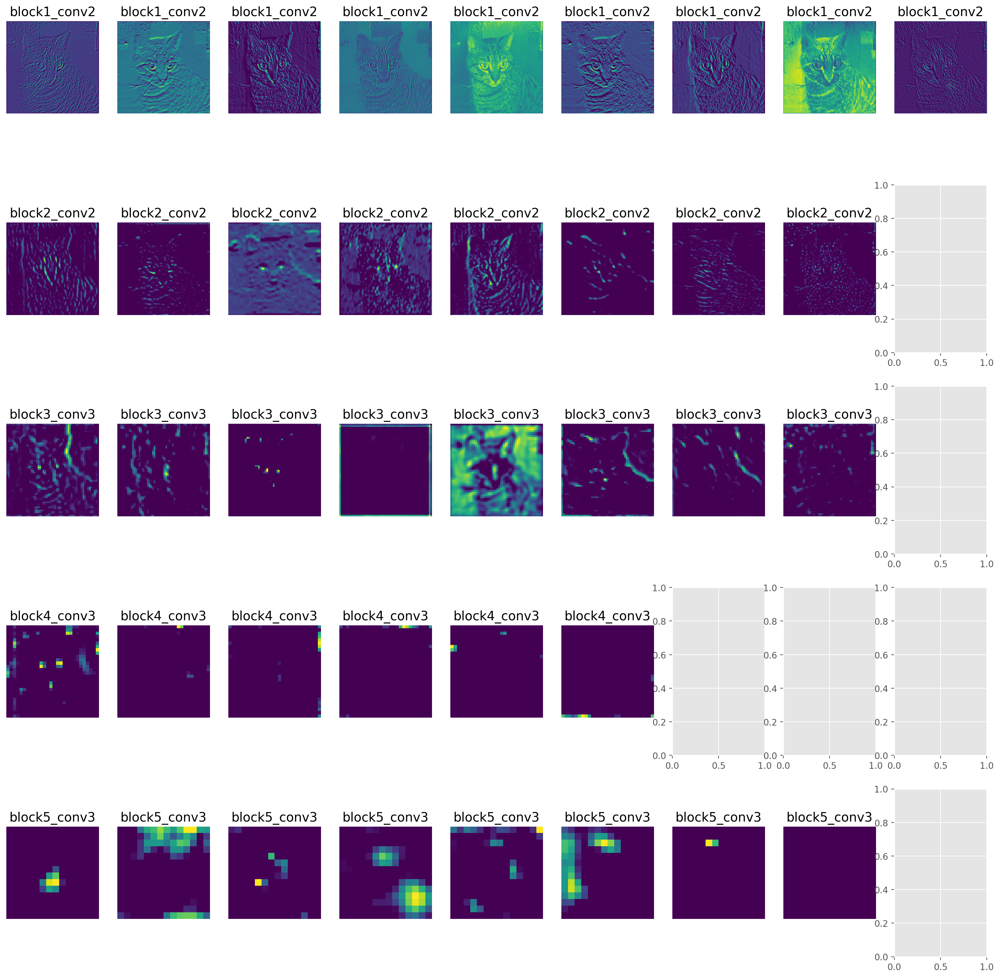

In [24]:
from tensorflow.keras.models import Model
from tensorflow.keras.applications import VGG16
from tensorflow.keras.preprocessing.image import img_to_array, load_img
import numpy as np
import matplotlib.pyplot as plt

# Parámetros de la visualización
max_filters = 40
selected_indices = [[], [], [], [], []]
vis_images = [[], [], [], [], []]
i = 0

# Capas de interés
layer_names = ['block1_conv2', 'block2_conv2', 'block3_conv3', 'block4_conv3', 'block5_conv3']

# Seleccionar filtros específicos para cada capa
selected_filters = [[0, 9, 13, 11, 25, 26, 33, 42, 62],
                    [8, 21, 23, 30, 39, 45, 59, 79],
                    [14, 48, 52, 54, 87, 107, 224, 229],
                    [25, 48, 63, 97, 147, 259],
                    [29, 77, 84, 104, 138, 206, 461, 487]]

for layer_name in layer_names:
    # Crear modelo intermedio para cada capa
    intermediate_layer_model = Model(inputs=model.input,
                                     outputs=model.get_layer(layer_name).output)

    # Si hay filtros seleccionados, usarlos
    if selected_filters:
        filters = selected_filters[i]
    else:
        filters = sorted(np.random.permutation(get_num_filters(model.get_layer(layer_name))))[:max_filters]

    selected_indices[i] = filters

    # Generar imágenes de entrada para cada filtro
    for filter_idx in filters:
        # Cargar la imagen de ejemplo
        img_path = '/content/Proyectos_de_Ingenieria/Entregables/Entregable_2/Perros_Gatos/test/Gatos/cat.1.jpg'
        img = load_img(img_path, target_size=(224, 224))
        img = img_to_array(img)
        img = np.expand_dims(img, axis=0)
        img = img / 255.0  # Normalizar la imagen

        # Obtener la salida de la capa intermedia para este filtro
        intermediate_output = intermediate_layer_model.predict(img)

        vis_images[i].append(intermediate_output[0, :, :, filter_idx])  # Visualizar cada filtro específico

    i += 1

# Generar una paleta de imágenes con 4 columnas para obtener 2 filas
fig, axes = plt.subplots(len(vis_images), len(vis_images[0]), figsize=(20, 20))
for j in range(len(vis_images)):
    for k in range(len(vis_images[j])):
        axes[j, k].imshow(vis_images[j][k], cmap='viridis')
        axes[j, k].axis('off')
        axes[j, k].set_title(layer_names[j])
plt.show()


In [32]:
!pip install tf-keras-vis
print(f'Dimensiones de vis_images: {len(vis_images)} x {len(vis_images[0])}')

Dimensiones de vis_images: 5 x 9


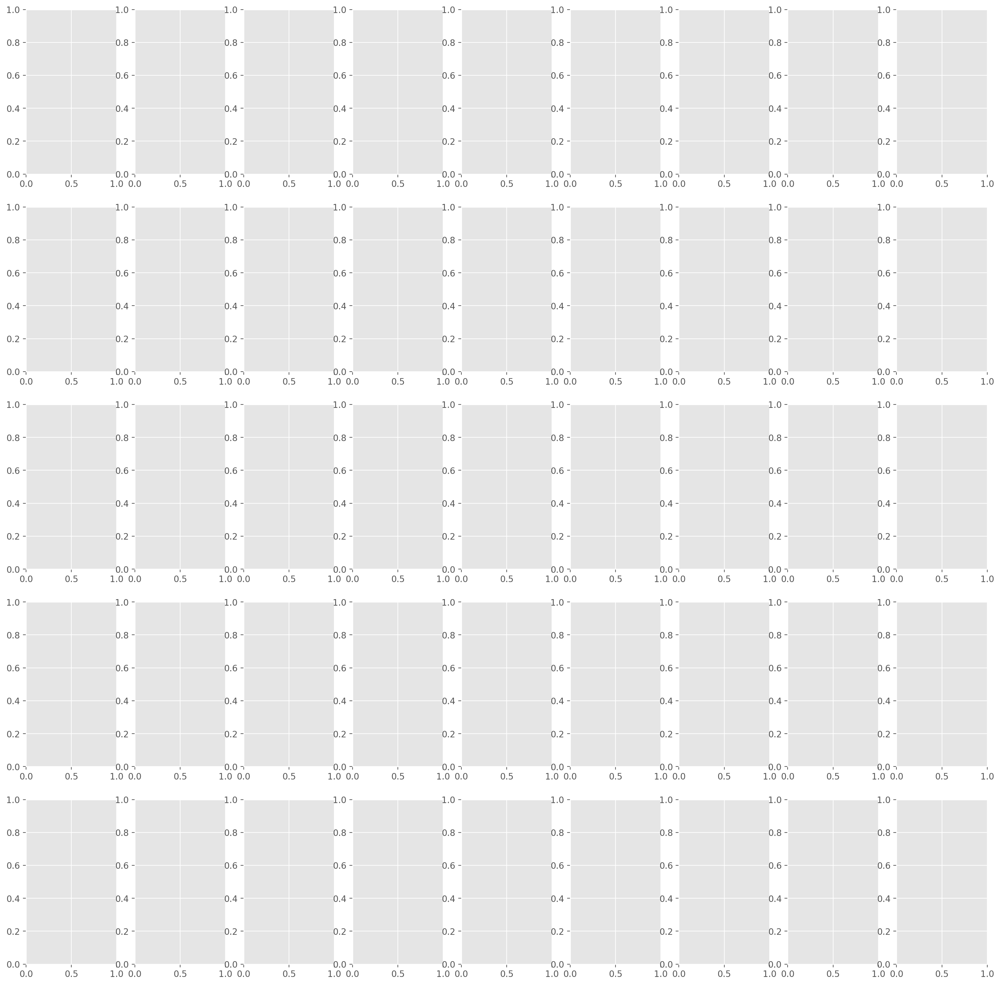

In [33]:
fig, axes = plt.subplots(len(vis_images), min(len(vis_images[0]), 64), figsize=(20, 20))

In [34]:
for i in range(len(vis_images)):
    for j in range(min(len(vis_images[i]), 64)):
        axes[i, j].imshow(vis_images[i][j], cmap='viridis')
        axes[i, j].axis('off')
        axes[i, j].set_title(layer_names[i])


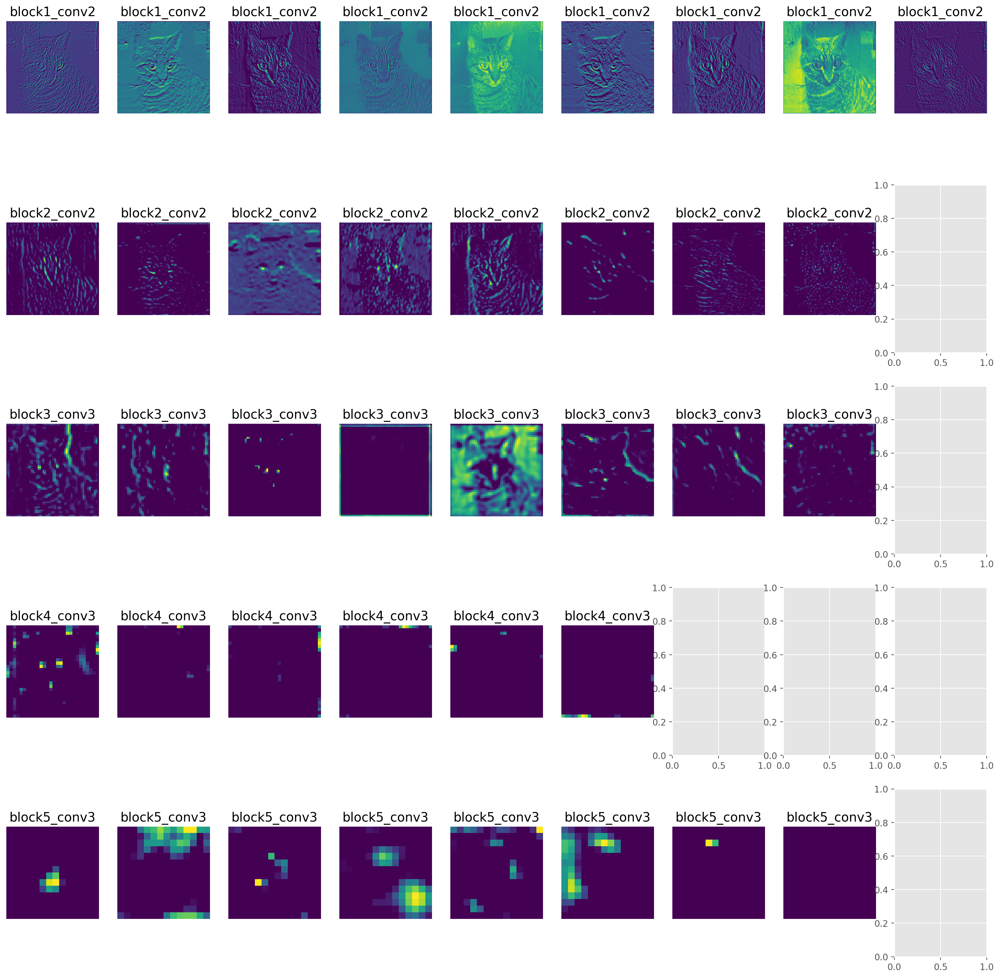

In [35]:
fig, axes = plt.subplots(len(vis_images), min(len(vis_images[0]), 64), figsize=(20, 20))
for i in range(len(vis_images)):
    for j in range(min(len(vis_images[i]), 64)):
        axes[i, j].imshow(vis_images[i][j], cmap='viridis')
        axes[i, j].axis('off')
        axes[i, j].set_title(layer_names[i])

plt.show()


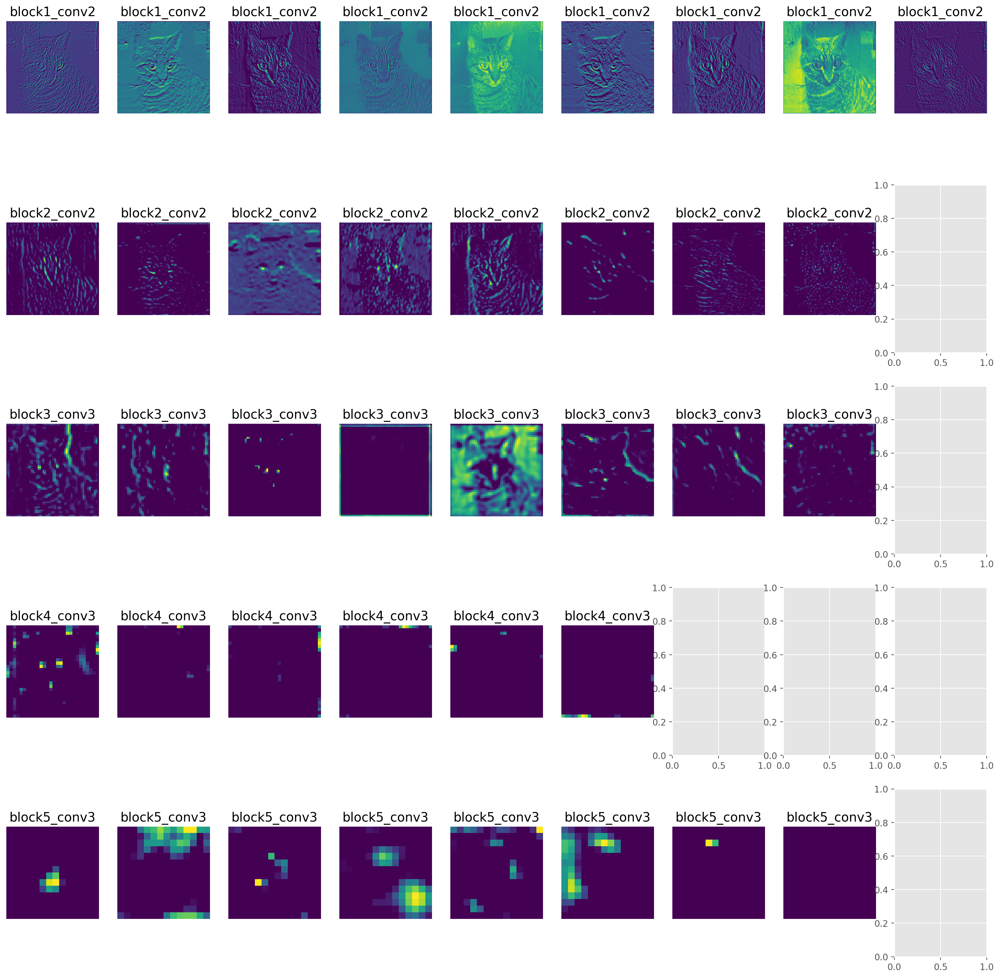

In [36]:
fig, axes = plt.subplots(len(vis_images), min(len(vis_images[0]), 64), figsize=(20, 20))
for i in range(len(vis_images)):
    for j in range(min(len(vis_images[i]), 64)):
        axes[i, j].imshow(vis_images[i][j], cmap='viridis')
        axes[i, j].axis('off')
        axes[i, j].set_title(layer_names[i])

plt.show()
